# Text extraction from Scanned Documents using OCR 

## Group Number : 44
### Team Members :
1. P S Sai Ganesh - CB.EN.U4AIE19044


In [2]:
#All the imports necessary
from skimage.filters import threshold_local
import numpy as np
import argparse
import cv2 as cv2
!pip install imutils
import imutils
import matplotlib.pyplot as plt
import os
import sys
from PIL import Image as im
from scipy.ndimage import interpolation as inter
import random
from skimage.transform import hough_line, hough_line_peaks, rotate
from skimage.feature import canny
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
from scipy.stats import mode

#Ignore warnings
import warnings
warnings.filterwarnings("ignore") 

  Preparing metadata (setup.py) ... done
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25834 sha256=e39521a7ba84fed25e5e715e294963d1e32bf7cbcecb069e777a3c1331ff3232
  Stored in directory: /root/.cache/pip/wheels/85/cf/3a/e265e975a1e7c7e54eb3692d6aa4e2e7d6a3945d29da46f2d7
Successfully built imutils


In [2]:
#Function to display the saved images with original size
def display(im_path):
    dpi = 200
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]
    
    #Calculated figure size
    figsize = width / float(dpi), height / float(dpi)

    #Creation of figure with axes
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    #Remove axis values
    ax.axis('off')
    ax.imshow(im_data, cmap='gray')

    plt.show()

## Reading the image

In [9]:
img_dir = "D:\MuN\Semester 3\IVM\Project"
img_name = "IMG_20240729_165057.jpg"
image_path = os.path.join(img_dir,img_name)

img = cv2.imread(image_path)

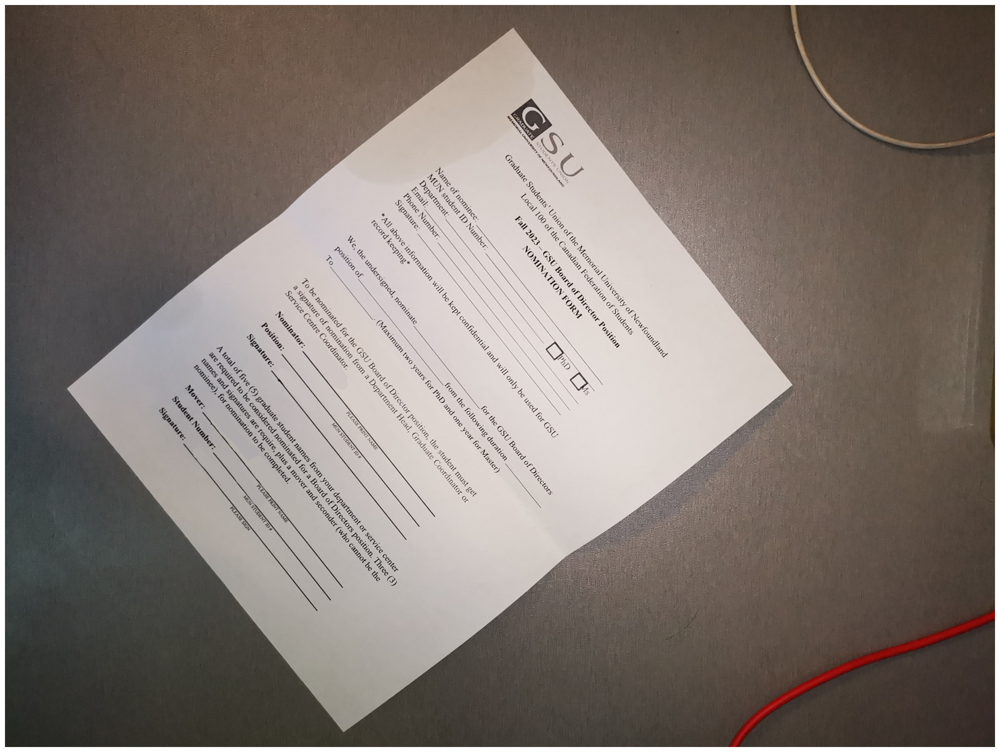

In [10]:
display(image_path)

## Preprocessing Technique 1
Convert input image to grayscale to reduce the number of channels from 3 to 1.

In [13]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

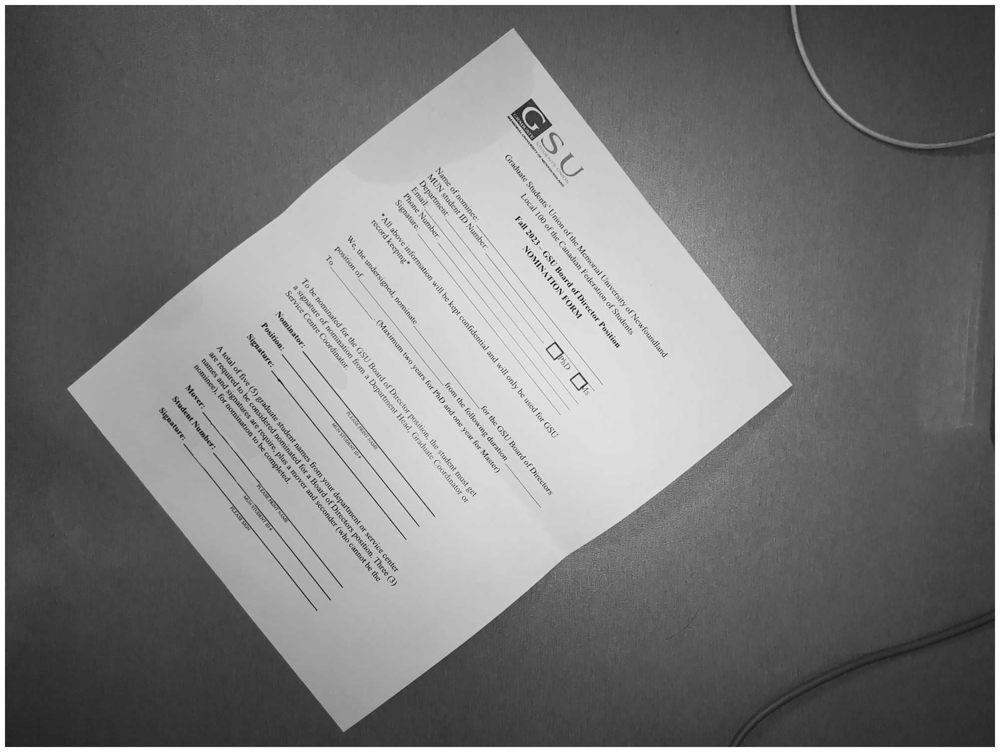

In [12]:
gray_image = grayscale(img)
gray_output_loc = os.path.join(img_dir, "grayscale.jpg")
cv2.imwrite(gray_output_loc, gray_image)
display(gray_output_loc)

## Preprocessing technique 2

Correct the rotation or skewness of image by using two methods :
1. Hough Transform 
2. Projection Profile

In [ ]:
#Function to rotate image without creating excess borders
def rotate_image(mat, angle):

    #Obtaining height and width of image
    height, width = mat.shape[:2]
    image_center = (width/2, height/2)

    rotation_mat = cv2.getRotationMatrix2D(image_center, angle, 1.)

    #For calculating the sin and cos values
    abs_cos = abs(rotation_mat[0,0]) 
    abs_sin = abs(rotation_mat[0,1])

    #New height and width
    bound_w = int(height * abs_sin + width * abs_cos)
    bound_h = int(height * abs_cos + width * abs_sin)

    #Use center of previous image to obtain new image at same origin
    rotation_mat[0, 2] += bound_w/2 - image_center[0]
    rotation_mat[1, 2] += bound_h/2 - image_center[1]

    #Rotate image using warp affine
    rotated_mat = cv2.warpAffine(mat, rotation_mat, (bound_w, bound_h))
    return rotated_mat

### Hough Transform method

In [ ]:
def correct_rotation(image):
  (h_m, w_m) = image.shape[:2]
  center_m = (w_m // 2, h_m // 2)

  def skew_angle_hough_transform(image,lim):
      
      blur = cv2.GaussianBlur(image, (7,7), 0)

      #Find the edges present in the image
      edges = canny(blur)

      #Apply hough line transform from 0-limit degrees with 0.1 step value
      tested_angles = np.deg2rad(np.arange(-lim,lim,1))
      h, theta, d = hough_line(edges, theta=tested_angles)
      
      #Find all the angles and line peaks
      accum, angles, dists = hough_line_peaks(h, theta, d)
      
      #Find the most common angle
      most_common_angle = mode(np.around(angles, decimals=2))[0]

      #Convert radians to degrees
      skew_angle = np.rad2deg(most_common_angle - np.pi/2)
      return skew_angle

  #Perform initial rotation check from 0 to 181 degrees
  ang_rot_init = skew_angle_hough_transform(image,181)+30
  print(ang_rot_init)

  #Final angle by which the image will be rotated by
  fin_ang = ang_rot_init

  #Applying the rotation to the image
  (h, w) = image.shape[:2]
  center = (w // 2, h // 2)
  M = cv2.getRotationMatrix2D(center, ang_rot_init, 1.0)
  rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, \
            borderMode=cv2.BORDER_REPLICATE)

  new_ang_rot = ang_rot_init

  temp_diff = 1
  temp_diff_mod = 1
    
  #Continue rotating image until the angles start oscilating
  for i in range(0,6):
    ang_rot = skew_angle_hough_transform(rotated,91)

    #Add the new angle to the final angle
    fin_ang = fin_ang + ang_rot

    #Find difference between previous angle and current angle
    diff = (new_ang_rot - ang_rot)
    diff_mod = abs(diff)%180

    print(diff,diff_mod)
    #If the angles start oscillating
    if((temp_diff==diff) or (temp_diff_mod==diff_mod)):

      #Perform 90 degree rotation when angle oscillates between 90 and 270
      if(diff == 0 or diff_mod == 0):
        ang_rot = skew_angle_hough_transform(rotated,91)
        fin_ang = fin_ang + ang_rot
      
      #Do not perform any angle rotation if angle oscillates between 0 and 180
      M = cv2.getRotationMatrix2D(center, ang_rot, 1.0)
      rotated = cv2.warpAffine(rotated, M, (w, h), flags=cv2.INTER_CUBIC, \
            borderMode=cv2.BORDER_REPLICATE)
      break;
    
    temp_diff = diff
    temp_diff_mod = diff_mod
  
    M = cv2.getRotationMatrix2D(center, ang_rot, 1.0)
    rotated = cv2.warpAffine(rotated, M, (w, h), flags=cv2.INTER_CUBIC, \
            borderMode=cv2.BORDER_REPLICATE)
    new_ang_rot = ang_rot

  add_angle = 180

  if(abs(fin_ang-ang_rot_init)<1 and ang_rot_init<-180):
    add_angle = 2*(ang_rot_init%180)

  fin_ang = fin_ang + add_angle
  rotated2 = rotate_image(image,fin_ang)

  print("Final angle : ",fin_ang)

  return rotated2,fin_ang

### Histogram Method 

In [27]:
def correct_rot_proj(image, limit, delta):

  #Apply thresholding on image to convert it to binary
  img = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,11,2)

  img = im.fromarray(img)
  wd, ht = img.size
  pix = np.array(img.convert('1').getdata(), np.uint8)
  bin_img = 1 - (pix.reshape((ht, wd)) / 255.0).astype("uint8")

  bin_img = cv2.medianBlur(bin_img, 5)

  angles = np.arange(-limit, limit+delta, delta)
  scores = []

  #Find the skew angle using histogram sum and score
  def find_angle(bin_img):
    def find_score(arr, angle):
        data = inter.rotate(arr, angle, reshape=False, order=0, mode='nearest')
        projection_profile = np.sum(data, axis=1)
        score = np.sum((projection_profile[1:] - projection_profile[:-1]) ** 2, dtype=float)
        return projection_profile, score

    #Append all scores
    for angle in angles:
        projection_profile, score = find_score(bin_img, angle)
        scores.append(score)

    best_score = max(scores)
    best_angle = angles[scores.index(best_score)]

    return best_angle
  
  best_angle = find_angle(bin_img)

  bin_img = inter.rotate(bin_img, best_angle, reshape=False, order=0)
  img = im.fromarray((255 * bin_img).astype("uint8")).convert("RGB")

  return img, best_angle

Best angle: 52


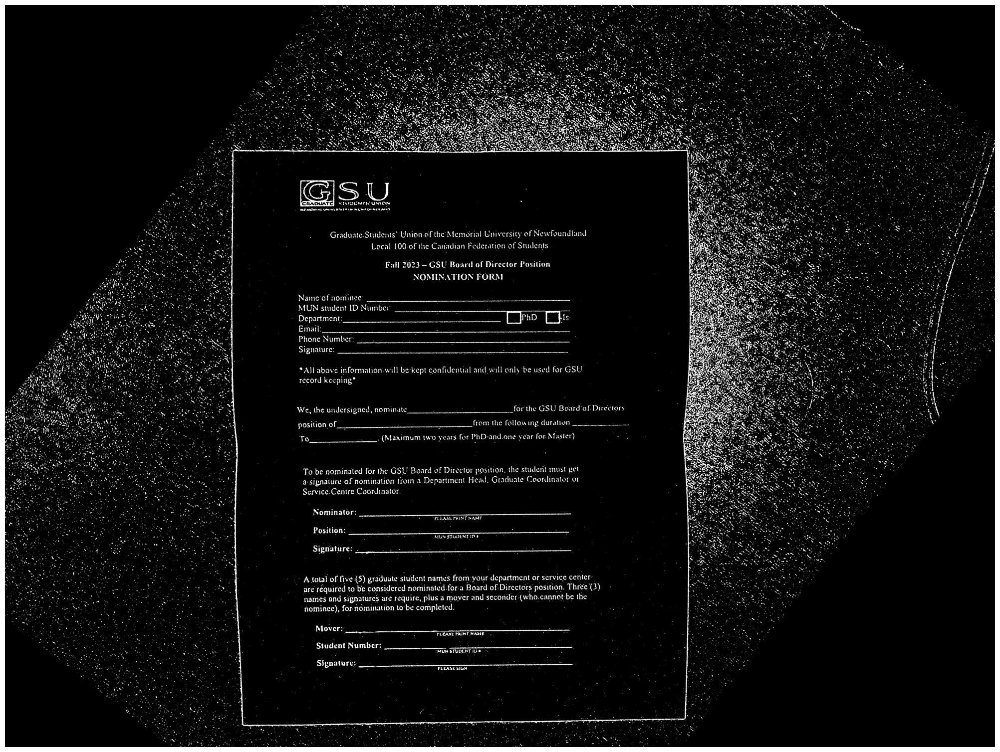

In [28]:
image = gray_image
rotated, best_angle = correct_rot_proj(image, 60, 2)
rotated = np.array(rotated, dtype=np.uint8)

print('Best angle: {}'.format(best_angle))

rot_image_loc = os.path.join(img_dir, "rotated.jpg")

cv2.imwrite(rot_image_loc, rotated)
display(rot_image_loc)

## Preprocessing Technique 3 

In [29]:
#Function for resampling the image or increasing the size of text
def resample(image,x,y):
  return cv2.resize(image,None, fx=x, fy=y, interpolation=cv2.INTER_LINEAR)

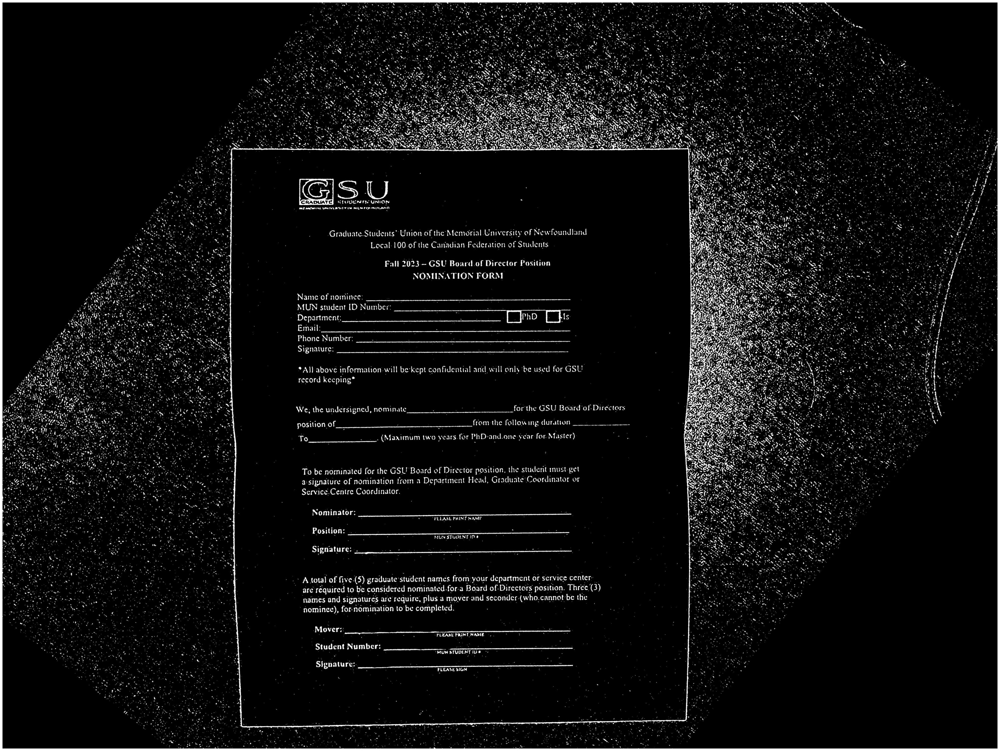

In [30]:
resample_image = resample(rotated,2,2)
resampled_loc = os.path.join(img_dir, "resample.jpg")
cv2.imwrite(resampled_loc, resample_image)
display(resampled_loc)

## Preprocessing Technique 4

Apply thresholding to the image to obtain a binarized image by calculating the threshold value using the OTSU method.

In [161]:
def thresholding(image):
  image = grayscale(image)
  thresh, im_bw = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
  return thresh,im_bw

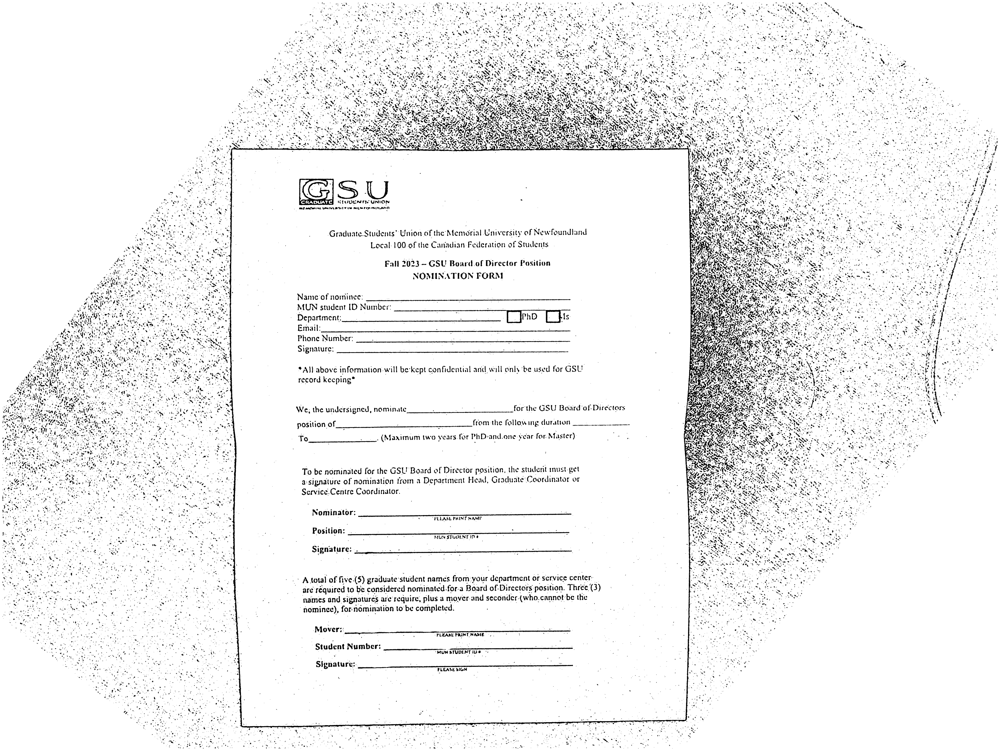

In [162]:
thresh,threshold_image = thresholding(resample_image)
thresholded_img_loc = os.path.join(img_dir, "threshold_img.jpg")
cv2.imwrite(thresholded_img_loc, threshold_image)
display(thresholded_img_loc)

## Preprocessing Technique 5

Extracting the exact part that contains the information from an image can be very crucial in obtaining a highly accurate text prediction.

In [202]:
def get_body(image):
  blur = cv2.GaussianBlur(image, (25,25), 0)
  thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 5))
  dilate = cv2.dilate(thresh, kernel, iterations=3)
  edges = cv2.Canny(dilate, 50, 150)


  plt.figure(figsize=(10,10))
  plt.axis('off')
  plt.imshow(dilate)


  plt.figure(figsize=(10,10))
  plt.axis('off')
  plt.imshow(edges)

  # Hough Line Transform
  lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=50, minLineLength=200, maxLineGap=20)

  # Filter lines (you can adjust the angle threshold)
  filtered_lines = []
  for line in lines:
      x1, y1, x2, y2 = line[0]
      angle = np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi
      if abs(angle) < 12 or abs(angle - 90) < 12:
          filtered_lines.append(line)

  # Find bounding box
  x_coords = [line[0][0] for line in filtered_lines] + [line[0][2] for line in filtered_lines]
  y_coords = [line[0][1] for line in filtered_lines] + [line[0][3] for line in filtered_lines]
  x_min, x_max = min(x_coords), max(x_coords)
  y_min, y_max = min(y_coords), max(y_coords)

  # Crop the document
  cropped_image = image[y_min:y_max, x_min:x_max]
  
  return cropped_image


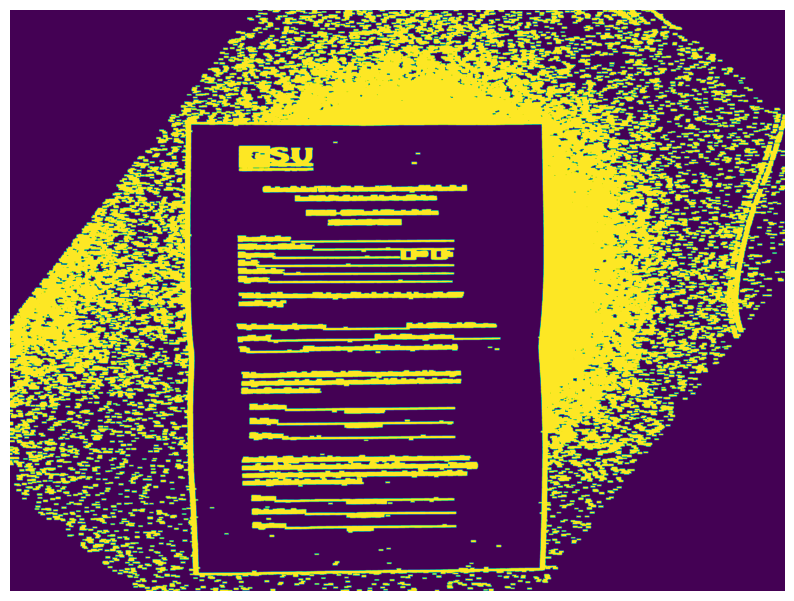

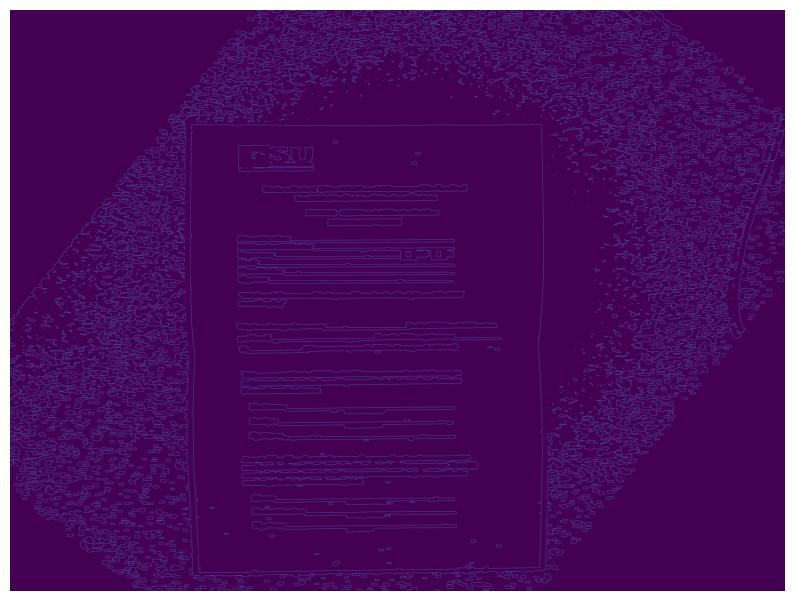

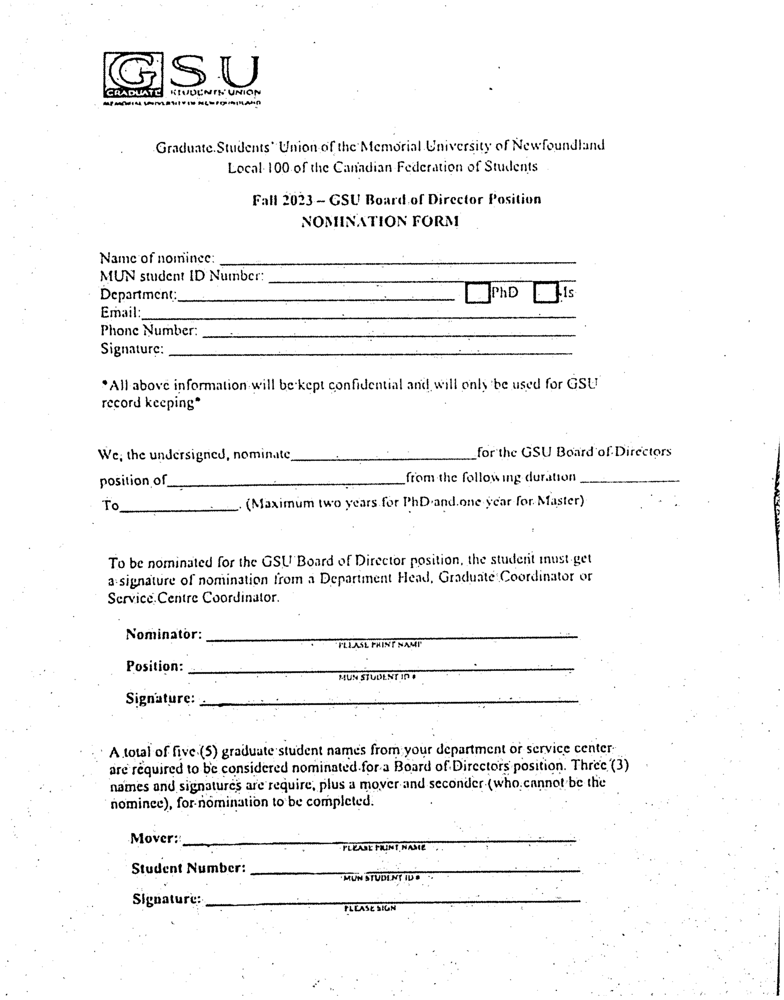

In [203]:
base_image = threshold_image.copy()

text_roi = get_body(threshold_image)
text_body_loc = os.path.join(img_dir, "textbody.jpg")
cv2.imwrite(text_body_loc, text_roi)
display(text_body_loc)

## Preprocessing Technique 6

In [219]:
def noise_removal(image):
    kernel_size = 4
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    closed_image = cv2.morphologyEx(image, cv2.MORPH_ERODE, kernel)
    
    return (cv2.fastNlMeansDenoising(closed_image, None, 100, 7, 21))

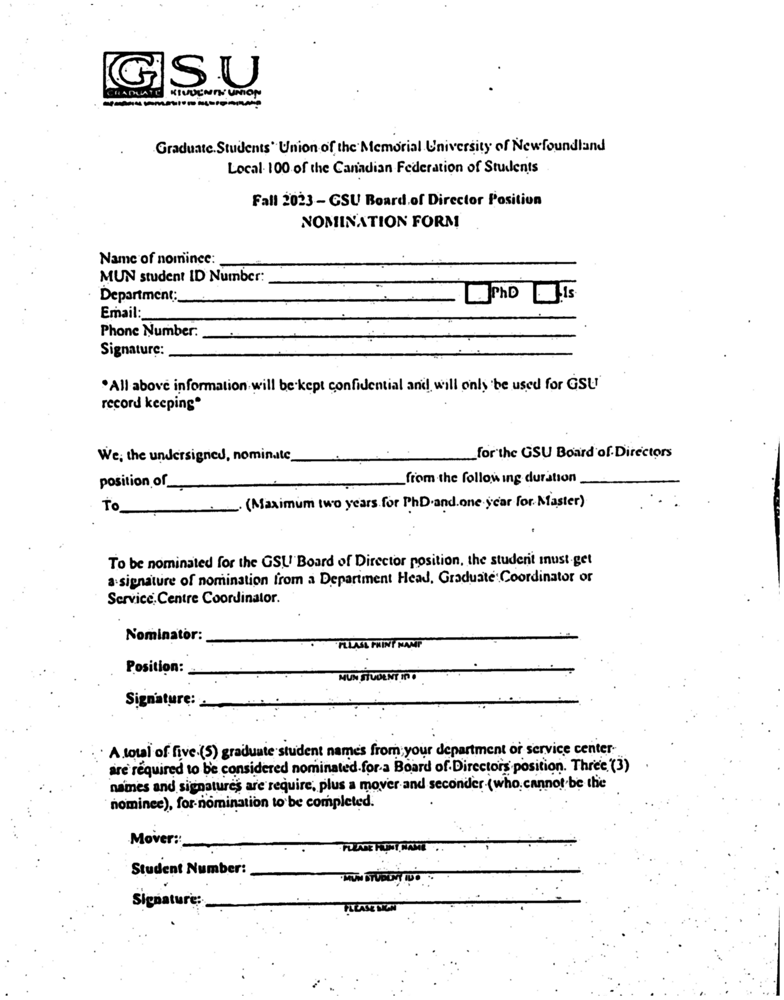

In [220]:
no_noise = noise_removal(text_roi)
noiseless_img_loc = os.path.join(img_dir, "noiseless_img.jpg")
cv2.imwrite(noiseless_img_loc, no_noise)
display(noiseless_img_loc)

In [6]:

#pip install pyspellchecker

import pytesseract
from pytesseract import Output
from textblob import TextBlob
import nltk 
nltk.download('words')
from nltk.corpus import words

#from spellchecker import SpellChecker

[nltk_data] Downloading package words to /usr/share/nltk_data...
[nltk_data]   Package words is already up-to-date!


## Use the PyTesseract engine to perform OCR on the pre-processed image

In [20]:
def extract_text(inp_image,conf_val):
    result = pytesseract.image_to_data(inp_image,config='-l eng --oem 1 --psm 6', output_type=Output.DICT)
    b_image = inp_image.copy()
    print(b_image.shape)
    height,width = b_image.shape
    print(b_image.shape)
    blank_image = np.ones((height,width), np.uint8)

    for i in range(0, len(result["text"])):
    #Extract bounding box coordinates (x,y,w,h)
        x = result["left"][i]
        y = result["top"][i]
        w = result["width"][i]
        h = result["height"][i]

    #Extract text and the confidence value
        text = result["text"][i]
        conf = int(result["conf"][i])
    print(text)
    print(conf)
    if (conf>conf_val):# and text.strip()!=''):
        #Strip out non-ASCII text so we can draw the text on the image
        #using OpenCV, then draw a bounding box around the text along
        #with the text itself
        text = "".join([c if ord(c) < 128 else "" for c in text]).strip()

        special_characters = "1234567890.!@#$%^&*()-+?_=,<>/"

        print("Confidence: {}".format(conf))
        print("Text: {}".format(text))
        print("")
        #Performing spellcheck
        if((len(text)>2) and (any(c in special_characters for c in text) == False) and (text not in words.words()) and text.strip()!=''):
            text = text.lower()
            text = str(TextBlob(text).correct())
            print("Confidence: {}".format(conf))
            print("Text: {}".format(text))
            print("")

        #Placing the box on the image 
        cv2.rectangle(b_image, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(blank_image, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.85, (0, 0, 255), 2)

    return blank_image,result["text"]

### Test Image 1 

(4534, 3548)
(4534, 3548)
ee
15


(-0.5, 3547.5, 4533.5, -0.5)

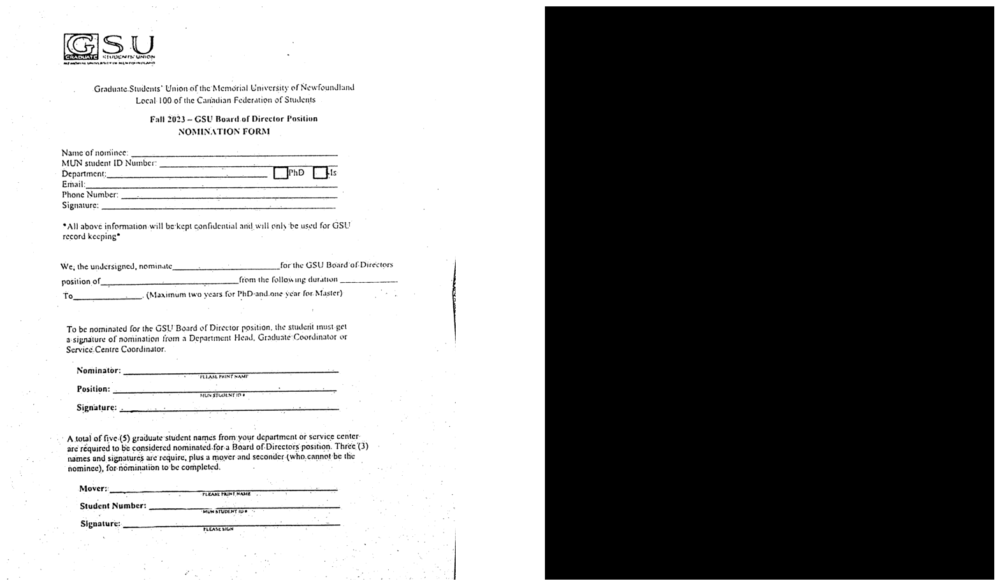

In [21]:
no_noise = cv2.imread('/kaggle/input/textbody/textbody.jpg')
no_noise = grayscale(no_noise)

extracted_image,ext_text = extract_text(no_noise,40)
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1)
plt.imshow(no_noise,cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(extracted_image,cmap='gray')
plt.axis('off')

### Test Image 2

[-149.95437384]

[-120.11494232] [120.11494232]

[-29.79380535] [29.79380535]

[0.] [0.]

[0.] [0.]

[-30.02193617]

Final angle :  [0.02369]


(-0.5, 1523.5, 1999.5, -0.5)

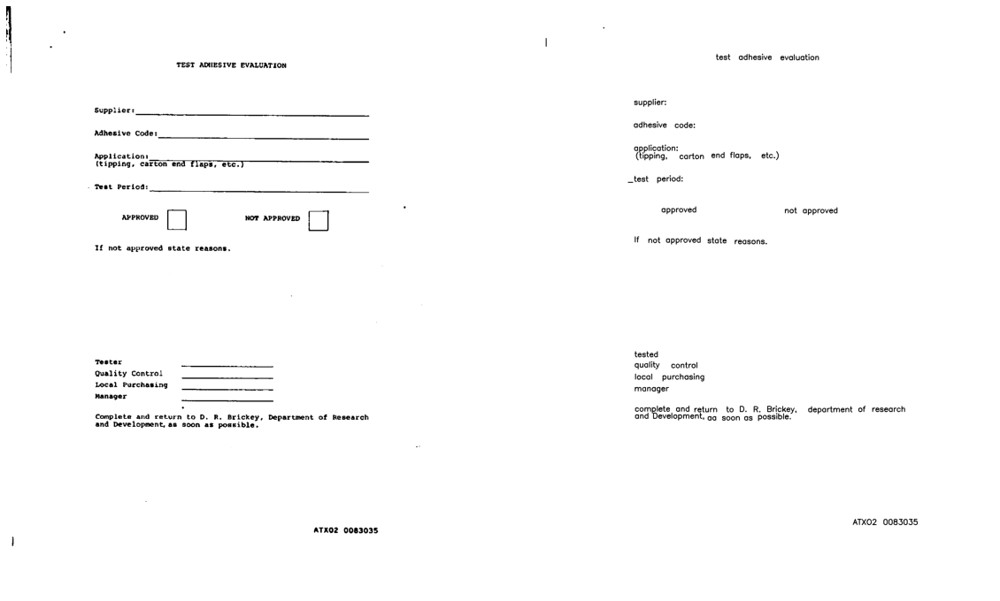

In [ ]:
image_file = "/content/drive/MyDrive/images/0060025670.png"
img = cv2.imread(image_file)

def preprocess_img(image):
  img = grayscale(image)
  img,rot_angle = correct_rotation(img)
  img = resample(img,2,2)
  thresh,img = thresholding(img)
  kernel = np.ones((1,1))
  img = cv2.erode(img,kernel,iterations=1)
  img = cv2.dilate(img,kernel,iterations=2)
  #img, text_body = get_body(img)
  img = noise_removal(img)
  return img

pre_img = preprocess_img(img)

extracted_image,ext_text = extract_text(pre_img,40)
plt.figure(figsize=(20,20)) 
plt.subplot(1, 2, 1)
plt.imshow(pre_img,cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(extracted_image,cmap='gray')
plt.axis('off')

### Test Image 3 

[-149.95437384]

[-120.11494232] [120.11494232]

[-29.79380535] [29.79380535]

[0.] [0.]

[0.] [0.]

[-30.02193617]

Final angle :  [0.02369]


(-0.5, 1507.5, 1999.5, -0.5)

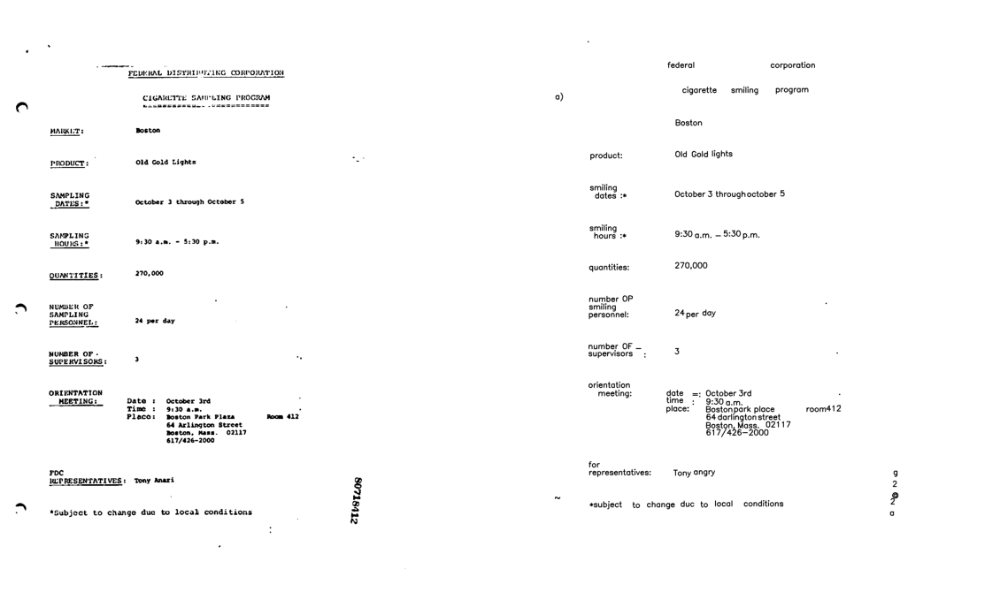

In [ ]:
image_file = "/content/drive/MyDrive/images/80718412_8413.png"
img = cv2.imread(image_file)

def preprocess_img(image):
  img = grayscale(image)
  img,rot_angle = correct_rotation(img)
  img = resample(img,2,2)
  thresh,img = thresholding(img)
  kernel = np.ones((1,1))
  img = cv2.erode(img,kernel,iterations=2)
  img = cv2.dilate(img,kernel,iterations=1)
  #img, text_body = get_body(img)
  img = noise_removal(img)
  return img

pre_img = preprocess_img(img)

extracted_image,ext_text = extract_text(pre_img,30)
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1)
plt.imshow(pre_img,cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(extracted_image,cmap='gray')
plt.axis('off')

### Test Image 4 

[-148.80845825]

[-118.96902673] [118.96902673]

[-29.79380535] [29.79380535]

[0.] [0.]

[0.] [0.]

[-30.02193617]

Final angle :  [1.16960559]


(-0.5, 1581.5, 2029.5, -0.5)

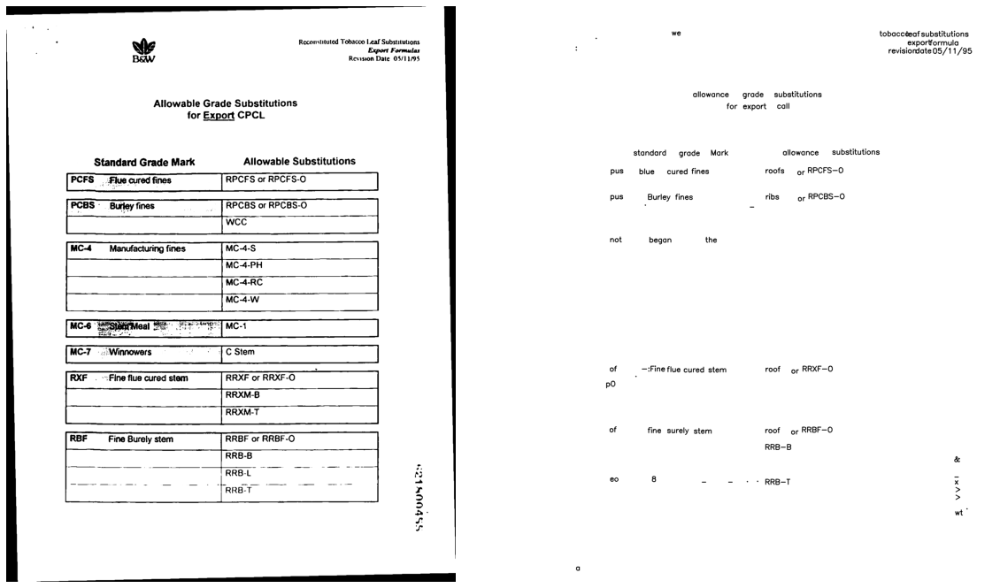

In [ ]:
image_file = "/content/drive/MyDrive/images/0001118259.png"
img = cv2.imread(image_file)

def preprocess_img(image):
  img = grayscale(image)
  #img, text_body = get_body(img)
  img,rot_angle = correct_rotation(img)
  img = resample(img,2,2)
  thresh,img = thresholding(img)
  kernel = np.ones((1,1))
  img = cv2.erode(img,kernel,iterations=2)
  img = cv2.dilate(img,kernel,iterations=1)
  img = noise_removal(img)
  return img

pre_img = preprocess_img(img)

extracted_image,ext_text = extract_text(pre_img,20)
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1)
plt.imshow(pre_img,cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(extracted_image,cmap='gray')
plt.axis('off')

### Test Image 5

[-239.90874767]

[-210.06931616] [30.06931616]

[-28.64788976] [28.64788976]

[177.61691649] [177.61691649]

[-177.61691649] [177.61691649]

[-211.03097327]

Final angle :  [-270.93972094]


(-0.5, 1304.5, 1677.5, -0.5)

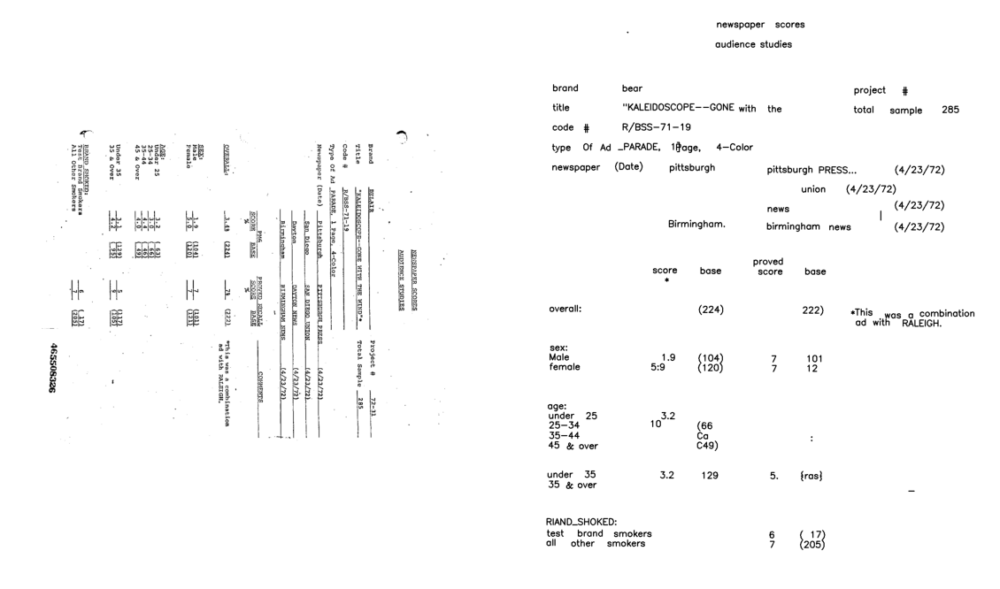

In [ ]:
image_file = "/content/drive/MyDrive/images/0001438955.png"
img = cv2.imread(image_file)

def preprocess_img(image):
  img = grayscale(image)
  img,rot_angle = correct_rotation(img)
  img = resample(img,2,2)
  thresh,img = thresholding(img)
  kernel = np.ones((1,1))
  img = cv2.erode(img,kernel,iterations=2)
  img = cv2.dilate(img,kernel,iterations=1)
  img, text_body = get_body(img)
  img = noise_removal(img)
  return img

pre_img = preprocess_img(img)

extracted_image,ext_text = extract_text(pre_img,30)
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1)
plt.imshow(img,cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(extracted_image,cmap='gray')
plt.axis('off')